# Dynamic Time Warping

In [110]:
# Import required libraries
import os
from traffic.core import Traffic, Flight
from traffic.data import airports
from traffic.data import opensky
from cartes.crs import EPSG_2180
import matplotlib.pyplot as plt
from pyproj import Transformer
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
from matplotlib.dates import DateFormatter
import time
import plotly.express as px
import re
from bs4 import BeautifulSoup
import plotly.graph_objects as go
import seaborn as sns
import pandas as pd
from sklearn.metrics import silhouette_score
import ruptures as rpt
import matplotlib.gridspec as gridspec
import hdbscan
from anomatools.models import kNNO
from tqdm import tqdm
from dtaidistance import dtw_ndim, dtw
from sklearn.neighbors import NearestNeighbors

In [44]:
# Set the path to the directory containing trajectory files
trajectories_folder = '../datasetsV2/dataset_specific_callsigns/trajectories'

In [45]:
def extract_flights_per_runway(callsign=None):
    """
    Extracts flights for each runway from the specified directory. Optionally filters by callsign.
    Returns a dictionary mapping runway numbers to Traffic objects.
    """
    runway_traffic = {}
    all_flights = []
    for subfolder in os.listdir(trajectories_folder):
        subfolder_path = os.path.join(trajectories_folder, subfolder)
        if os.path.isdir(subfolder_path):
            flights = []
            for filename in os.listdir(subfolder_path):
                if callsign and callsign in filename or not callsign:
                    file_path = os.path.join(subfolder_path, filename)
                    flights.append(Flight.from_file(file_path))
            if flights:
                runway_number = ''.join(filter(str.isdigit, subfolder))
                runway_traffic[int(runway_number)] = Traffic.from_flights(flights)
                all_flights.extend(flights)
    return runway_traffic, Traffic.from_flights(all_flights)

In [46]:
traffic_per_runway, traffic = extract_flights_per_runway()

In [47]:
traffic = traffic.compute_xy(EPSG_2180())

In [48]:
traffic = traffic.aircraft_data()

In [49]:
traffic = traffic.assign(
    quarter=lambda df: df.timestamp.dt.quarter,
    month=lambda df: df.timestamp.dt.month,
    day=lambda df: df.timestamp.dt.day,
    hour=lambda df: df.timestamp.dt.hour,
    weekday=lambda df: df.timestamp.dt.weekday,
)

In [50]:
traffic

,,count
icao24,callsign,
489324,LOT3VT,51867
48932b,LOT3VT,51400
489328,LOT3VT,49810
489329,LOT3VT,45005
48ad81,LOT774,43996
48ae25,LOT2LY,43448
48ad80,LOT774,35782
489329,LOT3904,35229
461e18,FIN1143,32326


# FDB1829 anomaly energy

In [6]:
traffic = Traffic.from_file("dtw_2d/FDB1829_anomalies.parquet")

In [7]:
traffic

,,count
icao24,callsign,
8964d3,FDB1829,4152
896531,FDB1829,3301
896530,FDB1829,2493
896532,FDB1829,2180
8965b6,FDB1829,1937
8965b1,FDB1829,1569
8965b2,FDB1829,1481
896518,FDB1829,1240
89656a,FDB1829,1195


In [9]:
for f in traffic:
    flight = f
    break

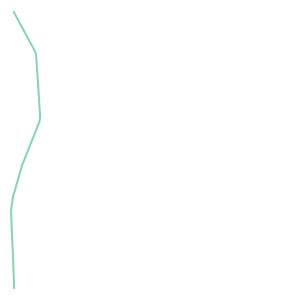

In [11]:
flight

In [27]:
flight = flight.resample('4s')

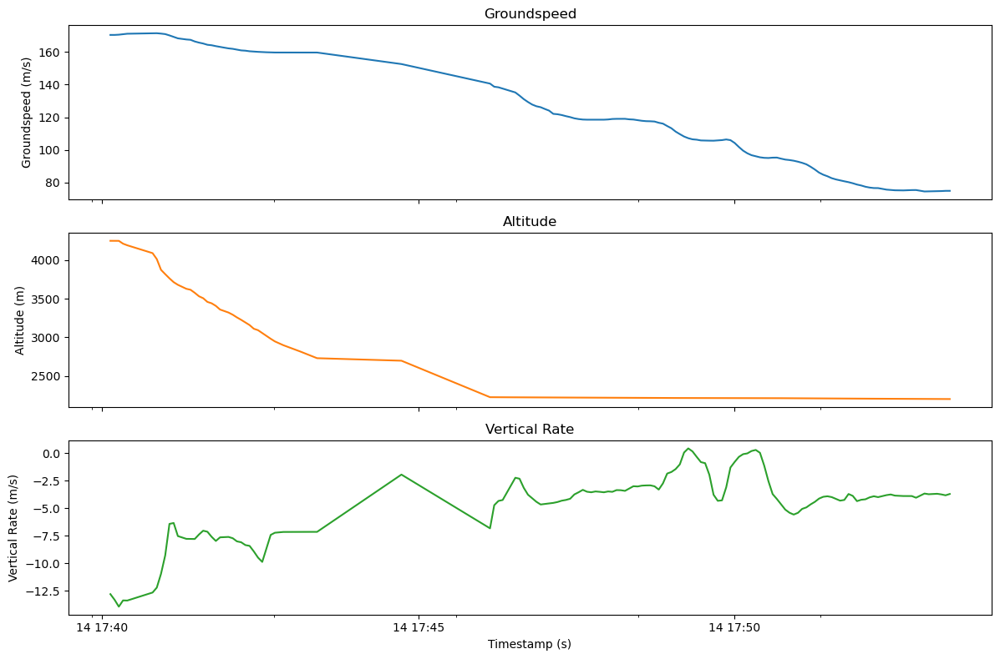

In [28]:
fig, axes = plt.subplots(3, 1, figsize=(12, 8), sharex=True)

flight.data.plot(x='timestamp', y='groundspeed', ax=axes[0], color='tab:blue', legend=False)
axes[0].set_ylabel('Groundspeed (m/s)')
axes[0].set_title('Groundspeed')

flight.data.plot(x='timestamp', y='altitude', ax=axes[1], color='tab:orange', legend=False)
axes[1].set_ylabel('Altitude (m)')
axes[1].set_title('Altitude')

flight.data.plot(x='timestamp', y='vertical_rate', ax=axes[2], color='tab:green', legend=False)
axes[2].set_ylabel('Vertical Rate (m/s)')
axes[2].set_title('Vertical Rate')

axes[2].set_xlabel('Timestamp (s)')
plt.tight_layout()
plt.show()

## Total Energy-Related Metrics

### Specific Total Energy

In [29]:
g = 9.80665  # gravitational acceleration in m/s^2

# Ensure 'altitude' and 'groundspeed' columns exist
if 'altitude' in flight.data.columns and 'groundspeed' in flight.data.columns:
    flight.data['specific_total_energy'] = flight.data['altitude'] + (flight.data['groundspeed'] ** 2) / g
else:
    print("Required columns 'altitude' and/or 'groundspeed' not found in flight.data")

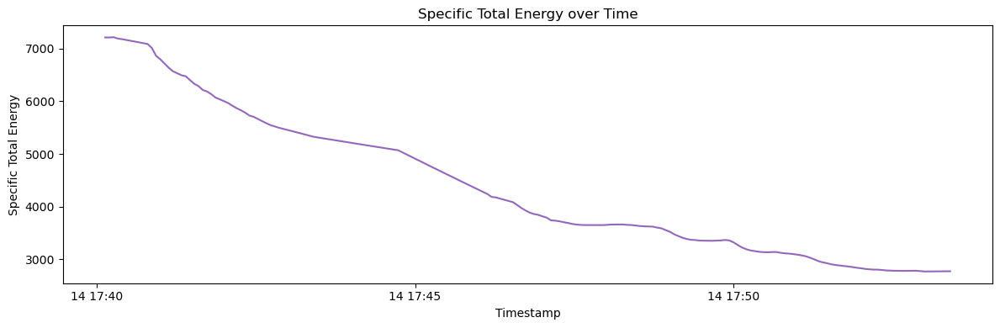

In [30]:
fig, ax = plt.subplots(figsize=(12, 4))
flight.data.plot(x='timestamp', y='specific_total_energy', ax=ax, color='tab:purple', legend=False)
ax.set_ylabel('Specific Total Energy')
ax.set_title('Specific Total Energy over Time')
ax.set_xlabel('Timestamp')
plt.tight_layout()
plt.show()

### Specific Potential Energy

In [31]:
# Specific potential energy is simply the altitude (h)
if 'altitude' in flight.data.columns:
    flight.data['specific_potential_energy'] = flight.data['altitude']
else:
    print("Column 'altitude' not found in flight.data")

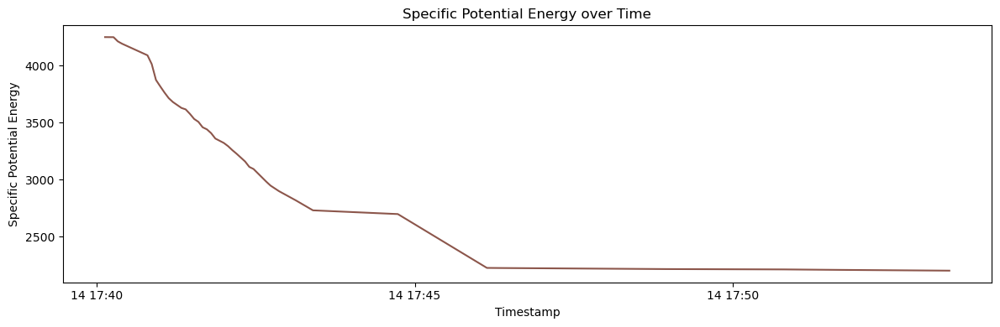

In [32]:
fig, ax = plt.subplots(figsize=(12, 4))
flight.data.plot(x='timestamp', y='specific_potential_energy', ax=ax, color='tab:brown', legend=False)
ax.set_ylabel('Specific Potential Energy')
ax.set_title('Specific Potential Energy over Time')
ax.set_xlabel('Timestamp')
plt.tight_layout()
plt.show()

### Specific Kinetic Energy

In [33]:
# Specific kinetic energy: V^2 / (2g)
if 'groundspeed' in flight.data.columns:
    flight.data['specific_kinetic_energy'] = (flight.data['groundspeed'] ** 2) / (2 * g)
else:
    print("Column 'groundspeed' not found in flight.data")

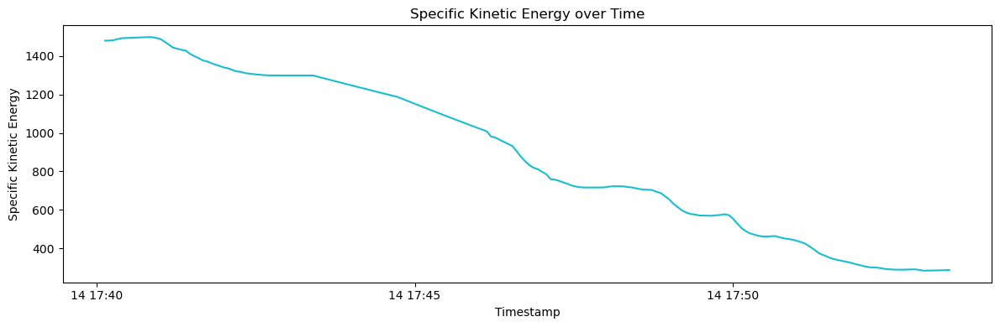

In [34]:
fig, ax = plt.subplots(figsize=(12, 4))
flight.data.plot(x='timestamp', y='specific_kinetic_energy', ax=ax, color='tab:cyan', legend=False)
ax.set_ylabel('Specific Kinetic Energy')
ax.set_title('Specific Kinetic Energy over Time')
ax.set_xlabel('Timestamp')
plt.tight_layout()
plt.show()

## Total Energy Rate-Related Metrics

### Specific Total Energy Rate

In [35]:
# Calculate specific total energy rate (derivative of specific_total_energy with respect to time)
if 'specific_total_energy' in flight.data.columns and 'timestamp' in flight.data.columns:
    # Calculate time difference in seconds
    dt = flight.data['timestamp'].diff().dt.total_seconds()
    # Calculate energy difference
    dE = flight.data['specific_total_energy'].diff()
    # Compute rate (dE/dt)
    flight.data['specific_total_energy_rate'] = dE / dt
else:
    print("Required columns 'specific_total_energy' and/or 'timestamp' not found in flight.data")

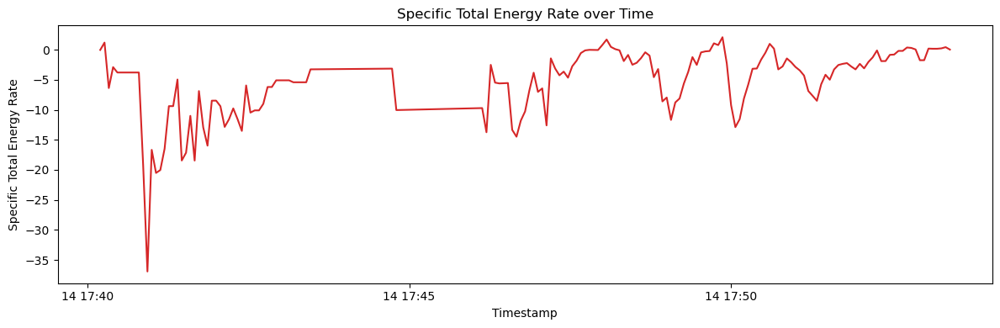

In [36]:
fig, ax = plt.subplots(figsize=(12, 4))
flight.data.plot(x='timestamp', y='specific_total_energy_rate', ax=ax, color='tab:red', legend=False)
ax.set_ylabel('Specific Total Energy Rate')
ax.set_title('Specific Total Energy Rate over Time')
ax.set_xlabel('Timestamp')
plt.tight_layout()
plt.show()

### Specific Potential Energy Rate

In [37]:
# Calculate specific potential energy rate (derivative of specific_potential_energy with respect to time)
if 'specific_potential_energy' in flight.data.columns and 'timestamp' in flight.data.columns:
    dt = flight.data['timestamp'].diff().dt.total_seconds()
    dEp = flight.data['specific_potential_energy'].diff()
    flight.data['specific_potential_energy_rate'] = dEp / dt
else:
    print("Required columns 'specific_potential_energy' and/or 'timestamp' not found in flight.data")

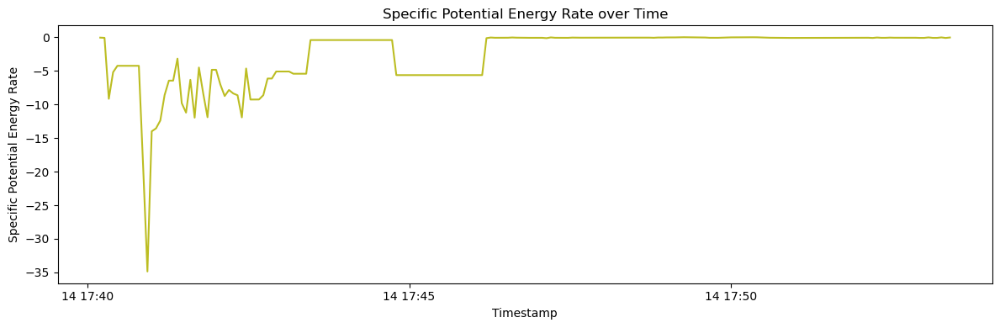

In [38]:
fig, ax = plt.subplots(figsize=(12, 4))
flight.data.plot(x='timestamp', y='specific_potential_energy_rate', ax=ax, color='tab:olive', legend=False)
ax.set_ylabel('Specific Potential Energy Rate')
ax.set_title('Specific Potential Energy Rate over Time')
ax.set_xlabel('Timestamp')
plt.tight_layout()
plt.show()

### Specific Kinetic Energy Rate

In [39]:
# Calculate specific kinetic energy rate (derivative of specific_kinetic_energy with respect to time)
if 'specific_kinetic_energy' in flight.data.columns and 'timestamp' in flight.data.columns:
    dt = flight.data['timestamp'].diff().dt.total_seconds()
    dEk = flight.data['specific_kinetic_energy'].diff()
    flight.data['specific_kinetic_energy_rate'] = dEk / dt
else:
    print("Required columns 'specific_kinetic_energy' and/or 'timestamp' not found in flight.data")

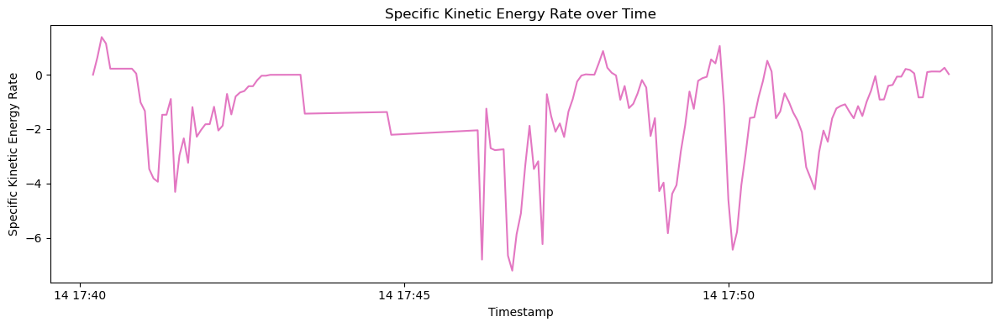

In [40]:
fig, ax = plt.subplots(figsize=(12, 4))
flight.data.plot(x='timestamp', y='specific_kinetic_energy_rate', ax=ax, color='tab:pink', legend=False)
ax.set_ylabel('Specific Kinetic Energy Rate')
ax.set_title('Specific Kinetic Energy Rate over Time')
ax.set_xlabel('Timestamp')
plt.tight_layout()
plt.show()

### Potential Flight-Path Angle
The Flight Path Angle (FPA) is the angle between an aircraft's velocity vector and the local horizontal plane. It indicates whether the aircraft is climbing (positive FPA) or descending (negative FPA). 

In [41]:
# Calculate Potential Flight-Path Angle (gamma_p)
# gamma_p = arcsin(vertical_rate / (groundspeed + epsilon)), in radians

epsilon = 1e-6  # small value to avoid division by zero

if 'vertical_rate' in flight.data.columns and 'groundspeed' in flight.data.columns:
    flight.data['potential_flight_path_angle'] = np.arcsin(
        flight.data['vertical_rate'] / (flight.data['groundspeed'] + epsilon)
    )
else:
    print("Required columns 'vertical_rate' and/or 'groundspeed' not found in flight.data")

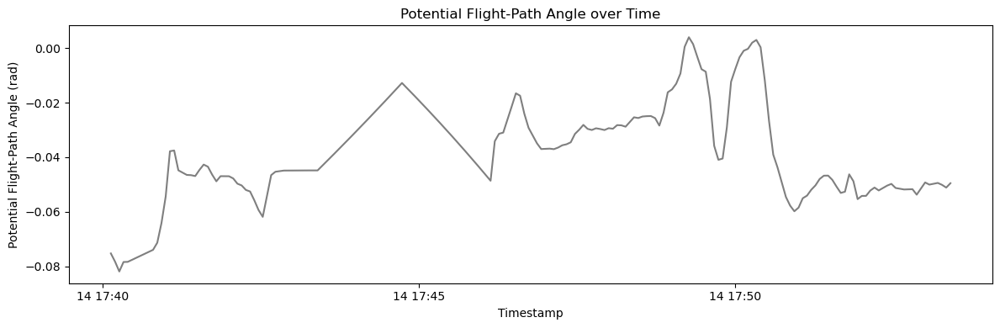

In [42]:
fig, ax = plt.subplots(figsize=(12, 4))
flight.data.plot(x='timestamp', y='potential_flight_path_angle', ax=ax, color='tab:gray', legend=False)
ax.set_ylabel('Potential Flight-Path Angle (rad)')
ax.set_title('Potential Flight-Path Angle over Time')
ax.set_xlabel('Timestamp')
plt.tight_layout()
plt.show()

# Anomaly Detection for Specific Total Energy

In [123]:
flights = []
energy_sequences = []
for f in tqdm(traffic):
    f = f.resample('4s')
    flights.append(f)
    f.data.loc[:, 'specific_total_energy'] = f.data['altitude'] + (f.data['groundspeed'] ** 2) / g
    seq = f.data['specific_total_energy'].values
    energy_sequences.append(seq)

  0%|          | 0/6744 [00:00<?, ?it/s]

100%|██████████| 6744/6744 [01:51<00:00, 60.71it/s]


In [124]:
len(energy_sequences)

6744

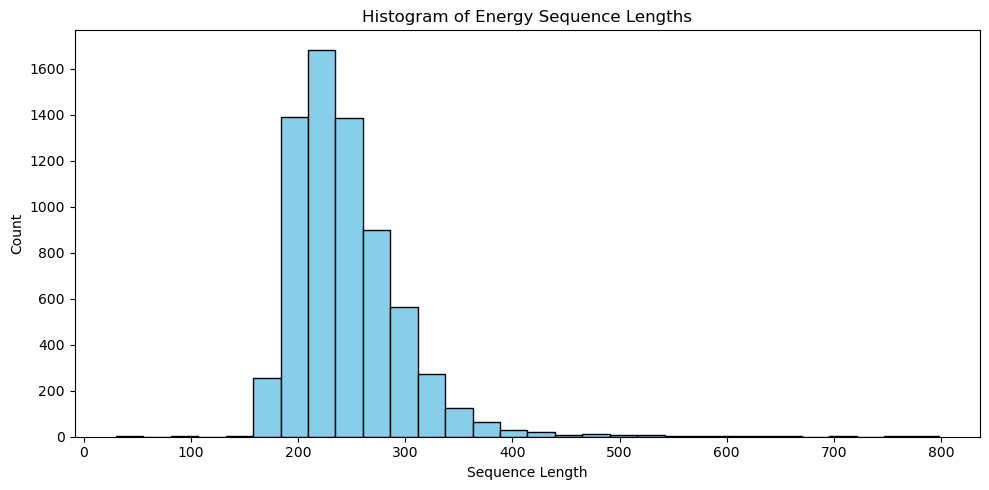

In [125]:
seq_lengths = [len(seq) for seq in energy_sequences]
plt.figure(figsize=(10, 5))
plt.hist(seq_lengths, bins=30, color='skyblue', edgecolor='black')
plt.xlabel('Sequence Length')
plt.ylabel('Count')
plt.title('Histogram of Energy Sequence Lengths')
plt.tight_layout()
plt.show()

In [126]:
seq_lengths = np.array([len(seq) for seq in energy_sequences])

In [128]:
from sklearn.cluster import KMeans
n_clusters = 20
lengths_reshape = seq_lengths.reshape(-1, 1)
labels = KMeans(n_clusters=n_clusters, random_state=0).fit_predict(lengths_reshape)

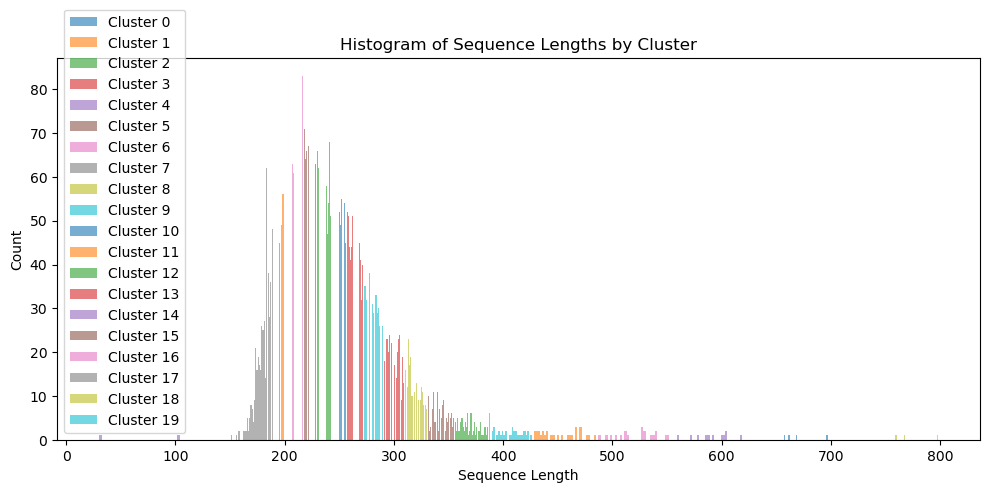

In [129]:
plt.figure(figsize=(10, 5))
for cluster_id in range(n_clusters):
    plt.hist(seq_lengths[labels == cluster_id], bins=30, alpha=0.6, label=f'Cluster {cluster_id}')
plt.xlabel('Sequence Length')
plt.ylabel('Count')
plt.title('Histogram of Sequence Lengths by Cluster')
plt.legend()
plt.tight_layout()
plt.show()

In [131]:
global_anomaly_indices = []
for cluster_id in range(n_clusters):
    idx = np.where(labels == cluster_id)[0]
    cluster_seqs = [energy_sequences[i] for i in idx]

    # Use the median-length sequence as reference
    median_len = int(np.median([len(seq) for seq in cluster_seqs]))
    reference_seq = cluster_seqs[np.argmin([abs(len(seq) - median_len) for seq in cluster_seqs])]

    # Compute DTW distances to the reference
    dtw_distances = [dtw.distance_fast(seq, reference_seq) for seq in cluster_seqs]

    # Anomalies: sequences above the 95th percentile
    threshold = np.percentile(dtw_distances, 95)
    anomaly_indices = np.where(np.array(dtw_distances) >= threshold)[0]
    global_anomaly_indices.extend(idx[anomaly_indices])
    print(f"Cluster {cluster_id}: Most outlying trajectories (DTW):", anomaly_indices)

Cluster 0: Most outlying trajectories (DTW): [ 56  62  88  91 123 143 151 154 180 224 246 251 262 265 314 348 364 378
 387 397 398 420 421 440 445 454 480 485 500 539 567 569 605 606 613 617
 674]
Cluster 1: Most outlying trajectories (DTW): [ 28  83  91 128 239 293 300 329 330 331 332 333 334 351 368 387 393 407
 414 449 457 461 503 514 551 559 562 564 572 591 602]
Cluster 2: Most outlying trajectories (DTW): [ 4  6 45 63 84]
Cluster 3: Most outlying trajectories (DTW): [ 57  61  88 107 132 151 155 162 182 187 195 225 240 242 259 304 334 341
 356 373]
Cluster 4: Most outlying trajectories (DTW): [8]
Cluster 5: Most outlying trajectories (DTW): [ 34 161 191 203 222 246 247 282 305 316 372 373 393 416 423 463 471 474
 476 492 506 512 515 551 559 568 585 587 625 644 708 712 714 724 733 734
 743 775 780 794]
Cluster 6: Most outlying trajectories (DTW): [5]
Cluster 7: Most outlying trajectories (DTW): [  2   5  18  99 134 142 177 183 190 194 227 238 287 290 292]
Cluster 8: Most outlying tr

In [132]:
os.makedirs("specific_total_energy", exist_ok=True)

for idx in global_anomaly_indices:
    flight = flights[idx]
    flight.to_parquet(f"specific_total_energy/{flight.callsign}_{flight.icao24}_{flight.start.date()}.parquet")

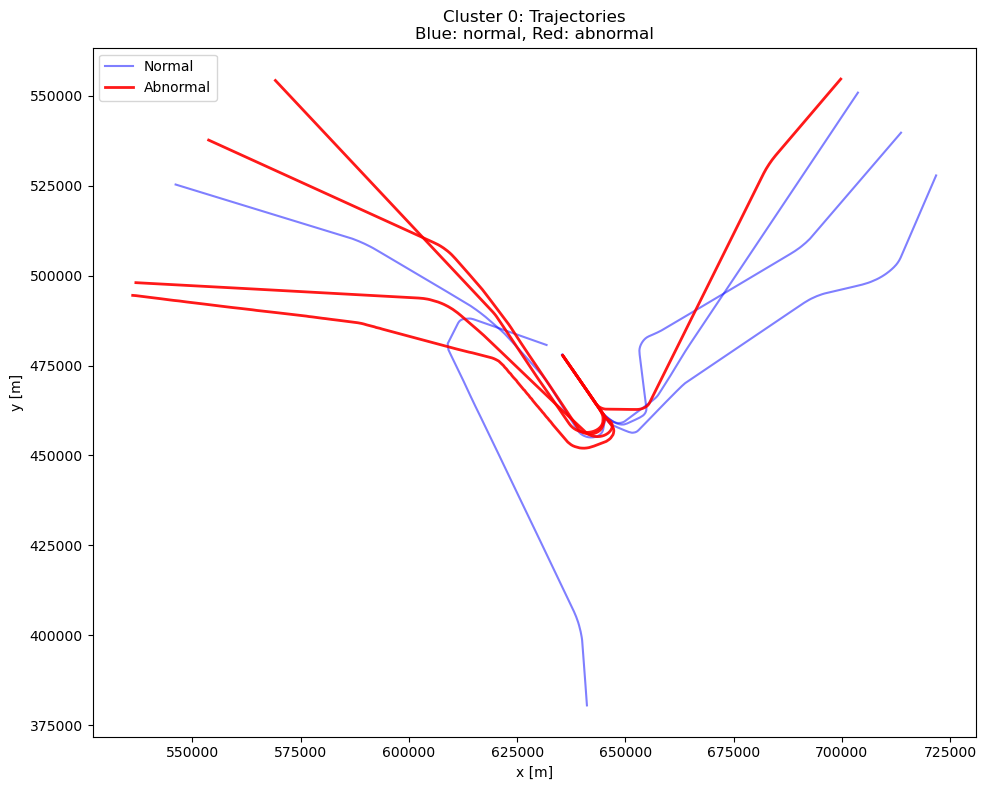

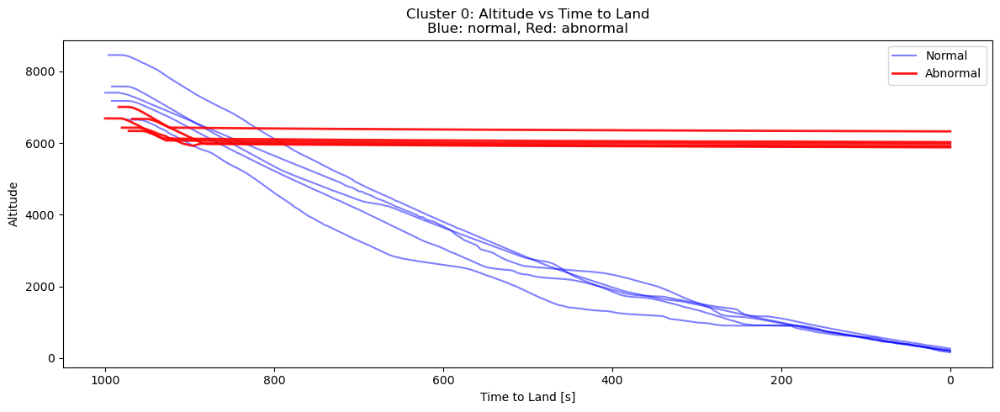

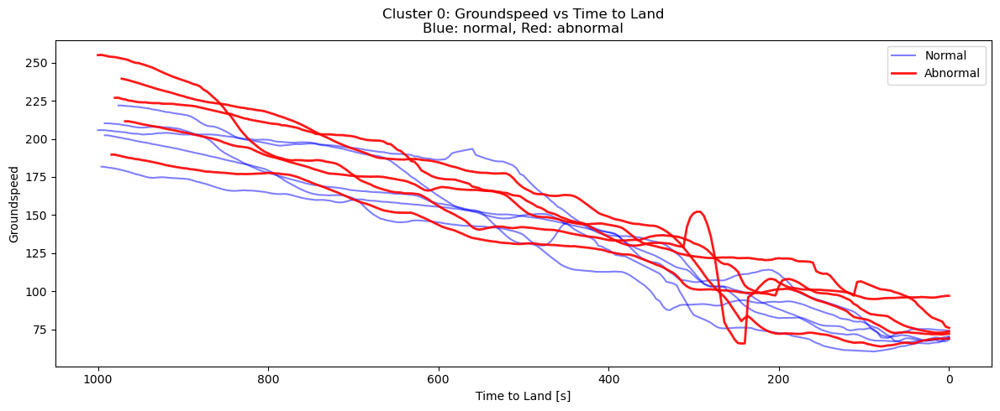

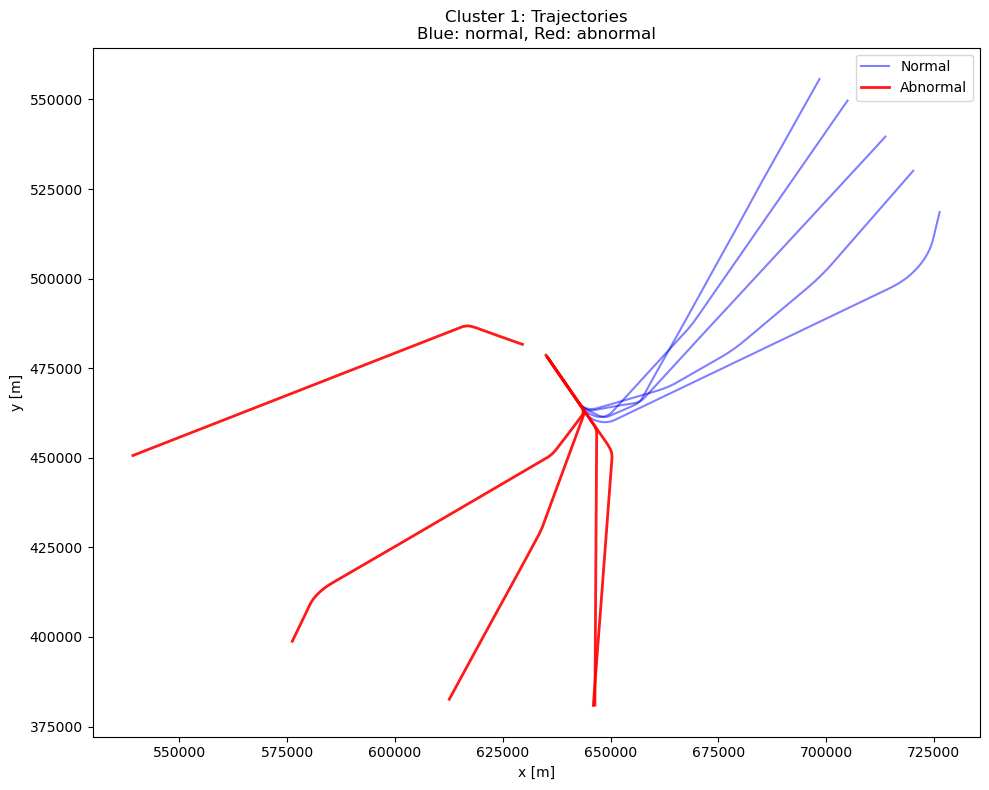

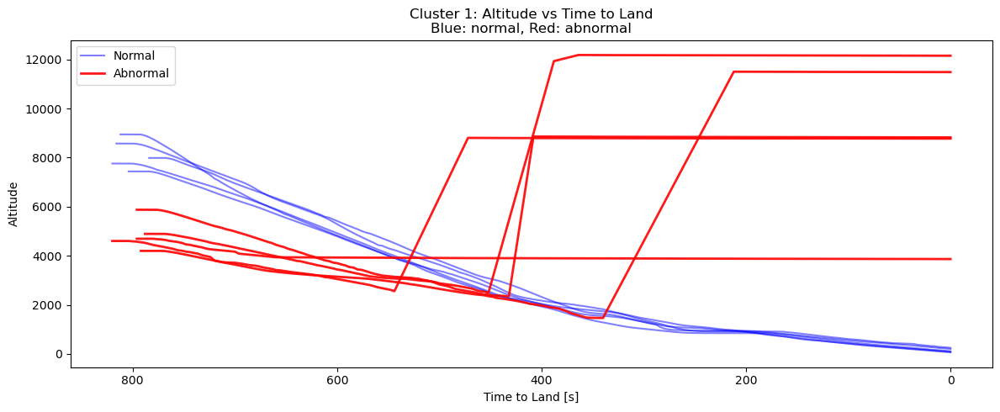

...

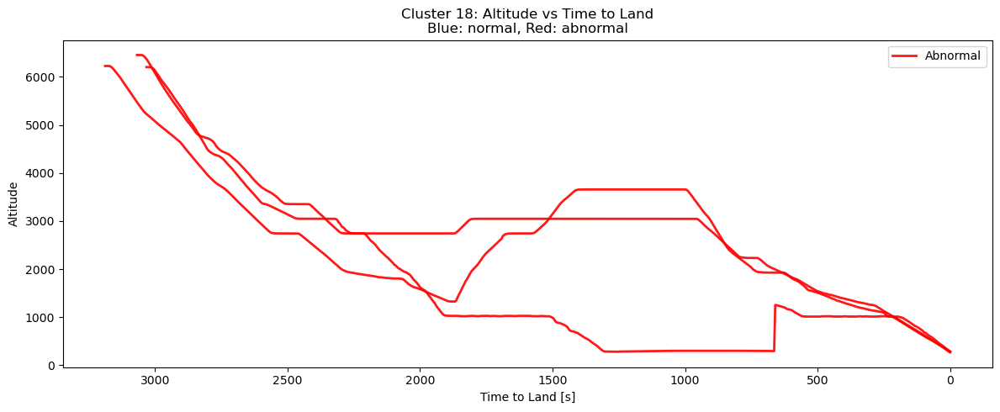

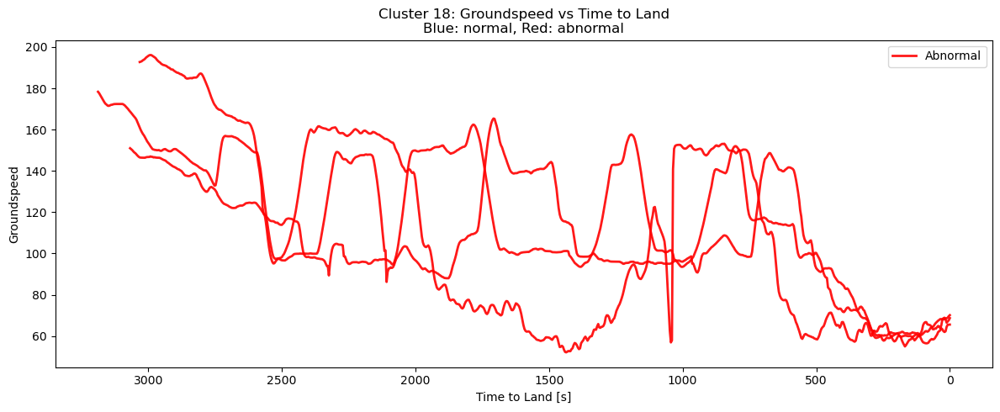

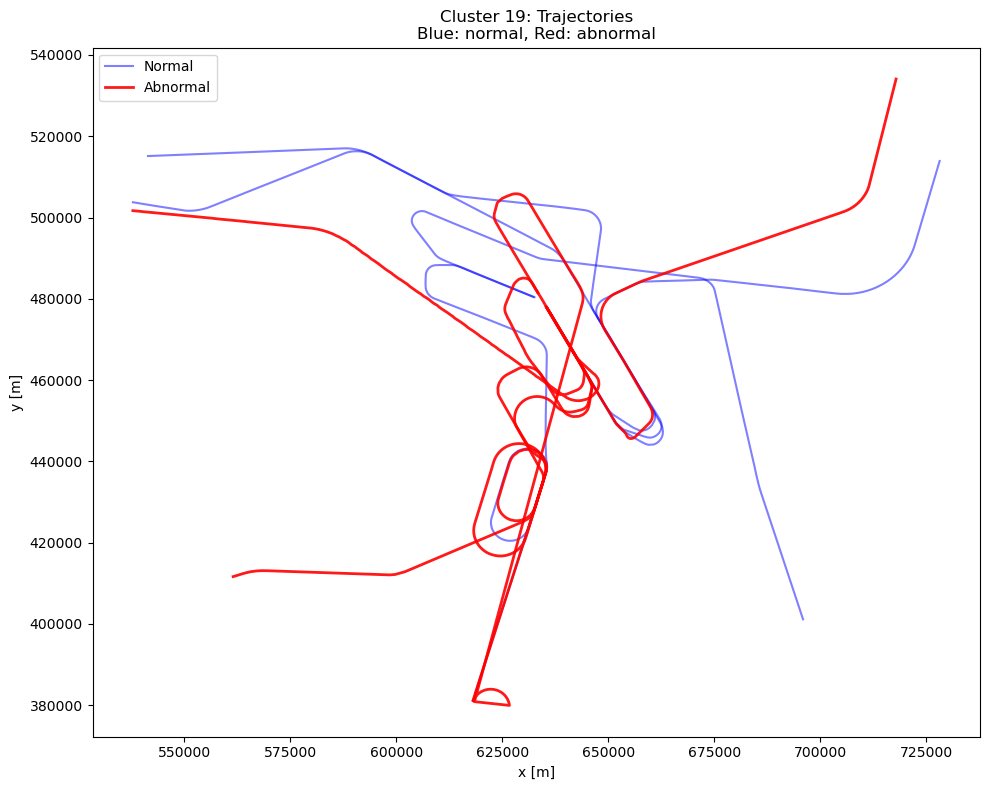

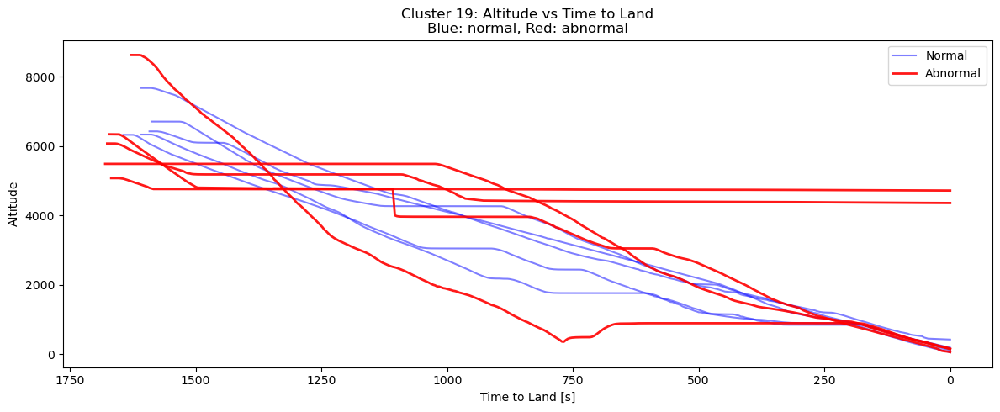

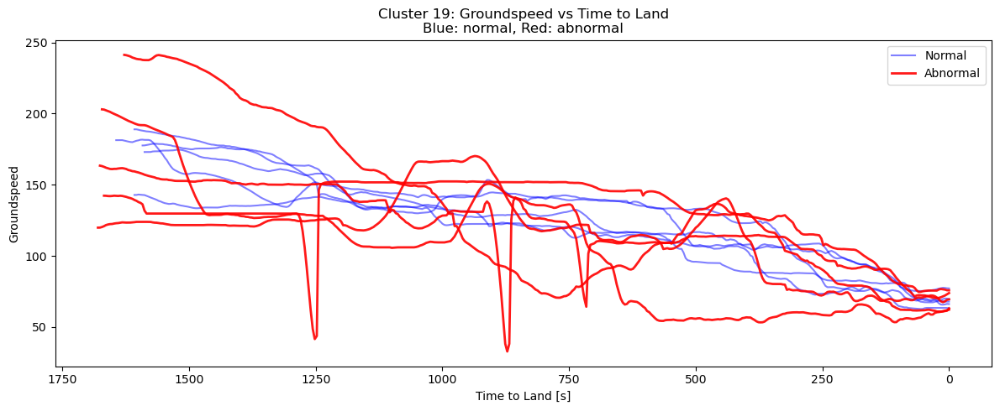

In [133]:
for cluster_id in range(n_clusters):
    idx = np.where(labels == cluster_id)[0]
    cluster_seqs = [energy_sequences[i] for i in idx]
    cluster_flights = [flights[i] for i in idx]

    # Reference: median length
    median_len = int(np.median([len(seq) for seq in cluster_seqs]))
    reference_seq = cluster_seqs[np.argmin([abs(len(seq) - median_len) for seq in cluster_seqs])]

    from dtaidistance import dtw
    dtw_distances = [dtw.distance_fast(seq, reference_seq) for seq in cluster_seqs]
    n_anomalies = 5
    anomaly_indices = np.argsort(dtw_distances)[-n_anomalies:]
    normal_indices = np.argsort(dtw_distances)[:-n_anomalies]
    normal_indices = normal_indices[:5]

    # Plot ground track
    plt.figure(figsize=(10, 8))
    for i in normal_indices:
        plt.plot(cluster_flights[i].data['x'], cluster_flights[i].data['y'], color='blue', alpha=0.5, label='Normal' if i == normal_indices[0] else "")
    for i in anomaly_indices:
        plt.plot(cluster_flights[i].data['x'], cluster_flights[i].data['y'], color='red', alpha=0.9, linewidth=2, label='Abnormal' if i == anomaly_indices[0] else "")
    plt.title(f"Cluster {cluster_id}: Trajectories\nBlue: normal, Red: abnormal")
    plt.xlabel("x [m]")
    plt.ylabel("y [m]")
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Plot altitude and groundspeed vs time_to_land (inverted x-axis)
    for param, color in zip(['altitude', 'groundspeed'], ['orange', 'green']):
        plt.figure(figsize=(12, 5))
        for i in normal_indices:
            df = cluster_flights[i].data
            time_to_land = (df['timestamp'].iloc[-1] - df['timestamp']).dt.total_seconds()
            plt.plot(time_to_land, df[param], color='blue', alpha=0.5, label='Normal' if i == normal_indices[0] else "")
        for i in anomaly_indices:
            df = cluster_flights[i].data
            time_to_land = (df['timestamp'].iloc[-1] - df['timestamp']).dt.total_seconds()
            plt.plot(time_to_land, df[param], color='red', alpha=0.9, linewidth=2, label='Abnormal' if i == anomaly_indices[0] else "")
        plt.title(f"Cluster {cluster_id}: {param.capitalize()} vs Time to Land\nBlue: normal, Red: abnormal")
        plt.xlabel("Time to Land [s]")
        plt.ylabel(param.capitalize())
        plt.legend()
        plt.gca().invert_xaxis()
        plt.tight_layout()
        plt.show()

Wee see that most of anomalies are caused by error in altitude measurements, which is used in the calculation of specific total energy.

# Anomaly Detection for Potential Flight-Path Angle

In [104]:
flights = []
energy_sequences = []
for f in tqdm(traffic):
    f = f.resample('4s')
    flights.append(f)
    f.data.loc[:, 'potential_flight_path_angle'] = np.arcsin(
        f.data['vertical_rate'] / (f.data['groundspeed'] + 1e-6)
    )
    seq = f.data['potential_flight_path_angle'].values
    energy_sequences.append(seq)

 86%|████████▌ | 5773/6744 [01:44<00:14, 66.39it/s]/home/mstrzezon/miniconda3/envs/traffic/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in arcsin
  result = getattr(ufunc, method)(*inputs, **kwargs)
100%|██████████| 6744/6744 [01:58<00:00, 56.95it/s]


In [111]:
seq_lengths = np.array([len(seq) for seq in energy_sequences])
n_clusters = 20
lengths_reshape = seq_lengths.reshape(-1, 1)
labels = KMeans(n_clusters=n_clusters, random_state=0).fit_predict(lengths_reshape)

In [114]:
global_anomaly_indices = []
for cluster_id in range(n_clusters):
    idx = np.where(labels == cluster_id)[0]
    cluster_seqs = [energy_sequences[i] for i in idx]

    # Use the median-length sequence as reference
    median_len = int(np.median([len(seq) for seq in cluster_seqs]))
    reference_seq = cluster_seqs[np.argmin([abs(len(seq) - median_len) for seq in cluster_seqs])]

    # Compute DTW distances to the reference
    dtw_distances = [dtw.distance_fast(seq, reference_seq) for seq in cluster_seqs]

    # Anomalies: sequences above the 95th percentile
    threshold = np.percentile(dtw_distances, 95)
    anomaly_indices = np.where(np.array(dtw_distances) >= threshold)[0]
    global_anomaly_indices.extend(idx[anomaly_indices])
    percent_anomalies = 100 * len(anomaly_indices) / len(cluster_seqs)
    print(f"Cluster {cluster_id}: Most outlying trajectories (DTW):", anomaly_indices)

Cluster 0: Most outlying trajectories (DTW): [  0   1   2   3   5   6   7   8   9  14  19  38  46  57  58  65 129 145
 146 149 155 158 162 165 221 255 281 314 332 349 350 381 415 428 444 575
 629]
Cluster 1: Most outlying trajectories (DTW): [ 34  37  41  49  85  89  98 128 139 149 202 226 247 268 304 305 315 331
 332 333 357 387 394 406 407 416 467 505 514 562 600]
Cluster 2: Most outlying trajectories (DTW): [38 40 43 53 57]
Cluster 3: Most outlying trajectories (DTW): [ 14  17  24  30  33  35  39  40 109 119 186 195 202 245 287 304 348 360
 380 381]
Cluster 4: Most outlying trajectories (DTW): [9]
Cluster 5: Most outlying trajectories (DTW): [ 10  34  35  36  43  45  53  55  56  75  76  79  84 133 135 142 245 287
 289 305 310 324 344 364 386 423 463 476 512 543 559 563 632 665 677 750
 752 758 770 786]
Cluster 6: Most outlying trajectories (DTW): [4]
Cluster 7: Most outlying trajectories (DTW): [  2   3  43  76 101 110 127 195 219 220 221 248 256 261 292]
Cluster 8: Most outlying tr

In [115]:
len(global_anomaly_indices)

332

In [117]:
os.makedirs("potential_flight_path_angle_anomalies", exist_ok=True)

for idx in global_anomaly_indices:
    flight = flights[idx]
    flight.to_parquet(f"potential_flight_path_angle_anomalies/{flight.callsign}_{flight.icao24}_{flight.start.date()}.parquet")

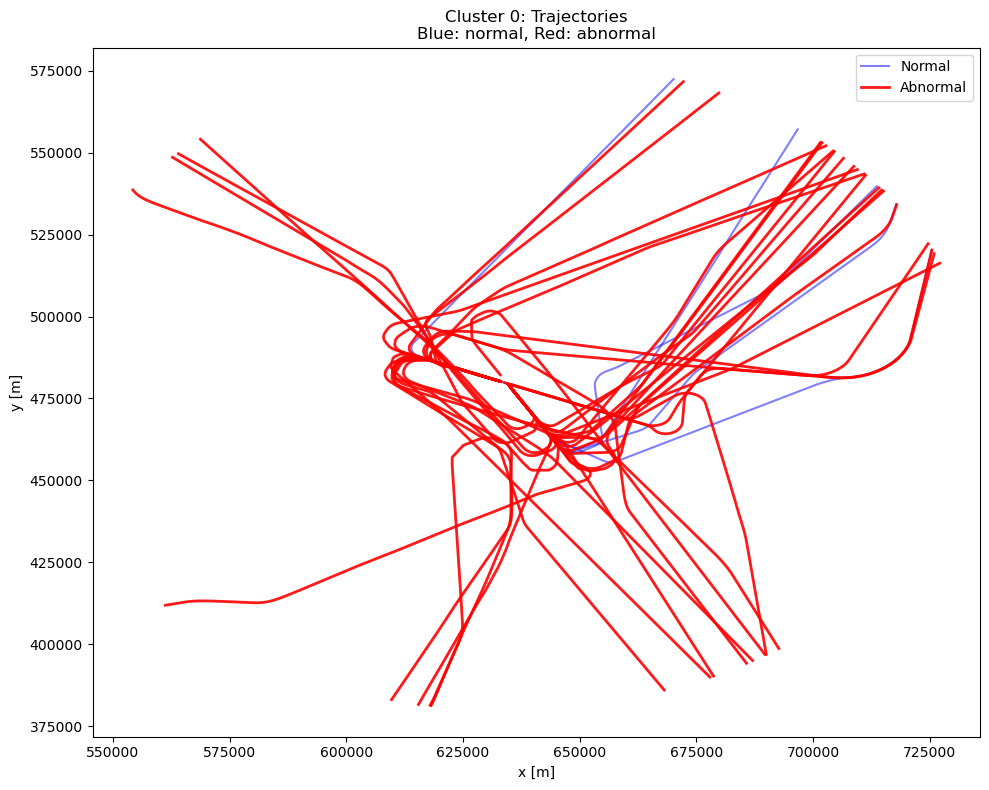

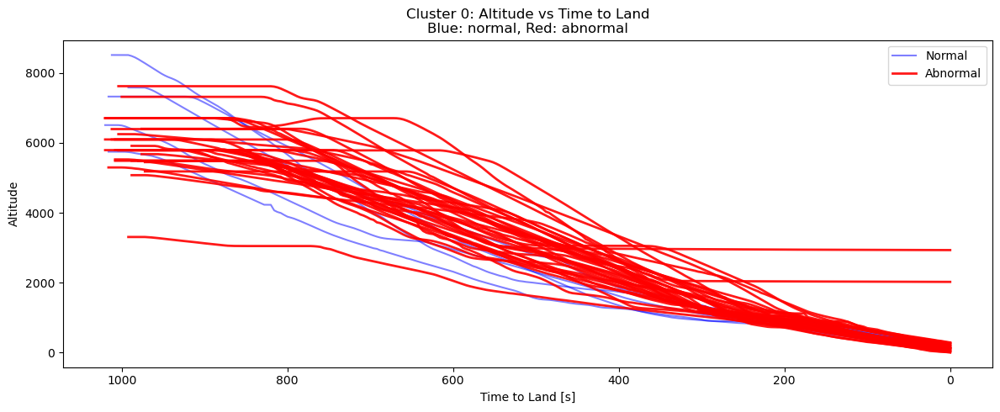

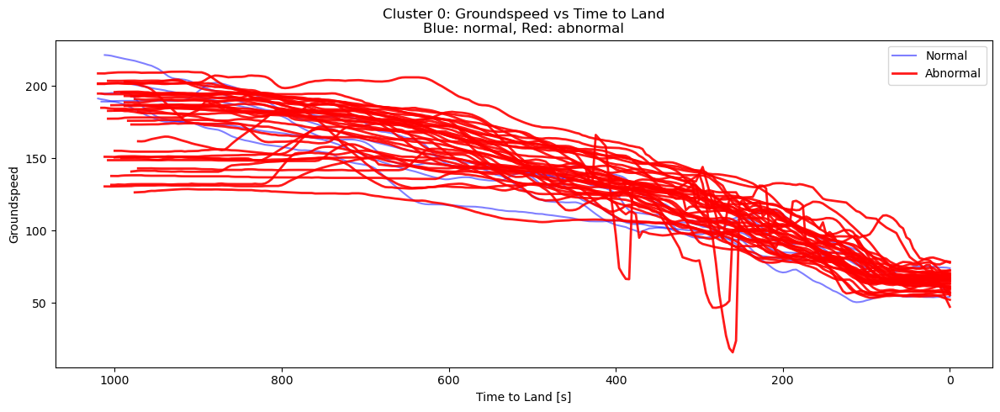

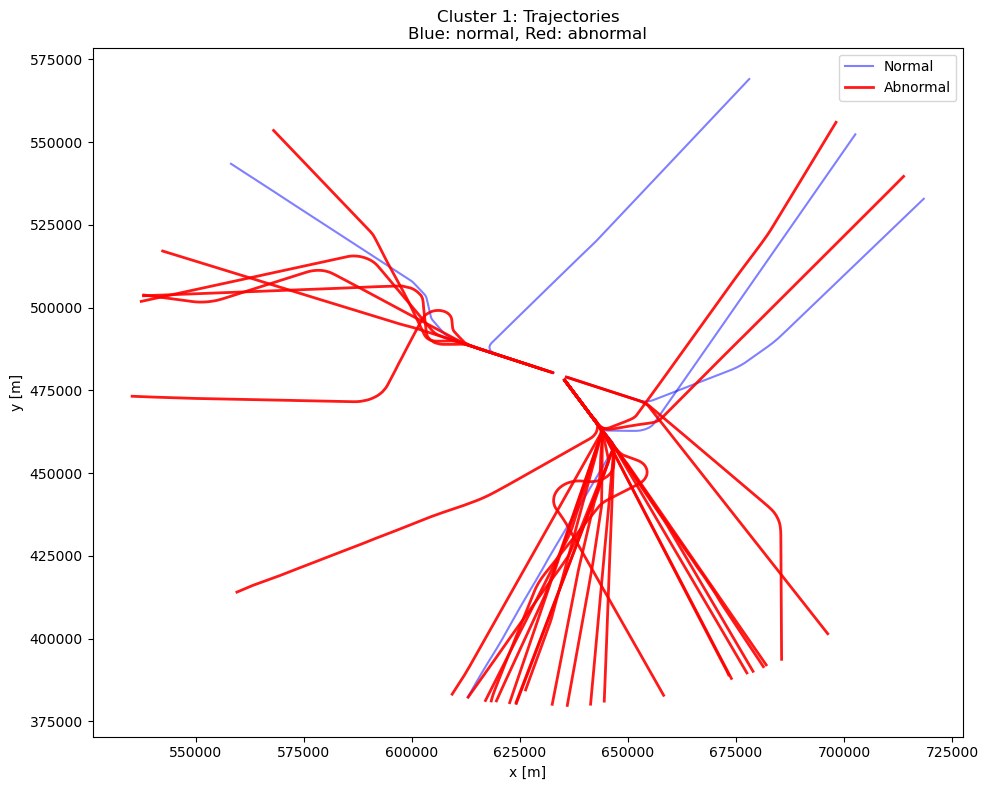

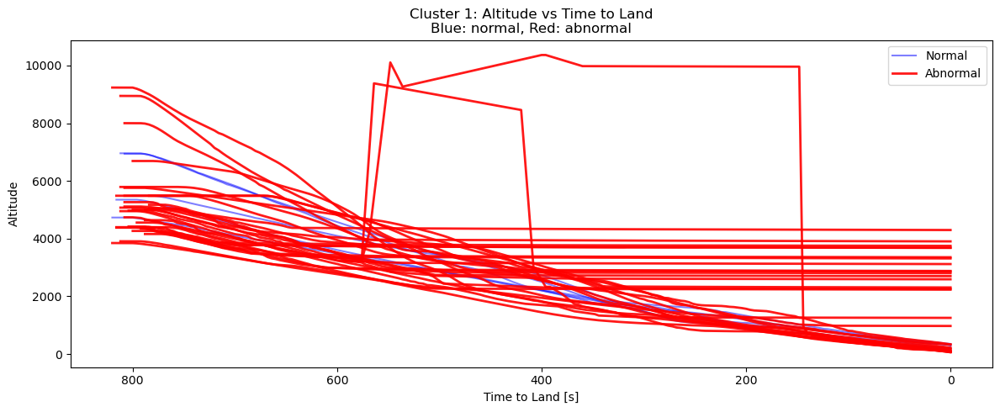

...

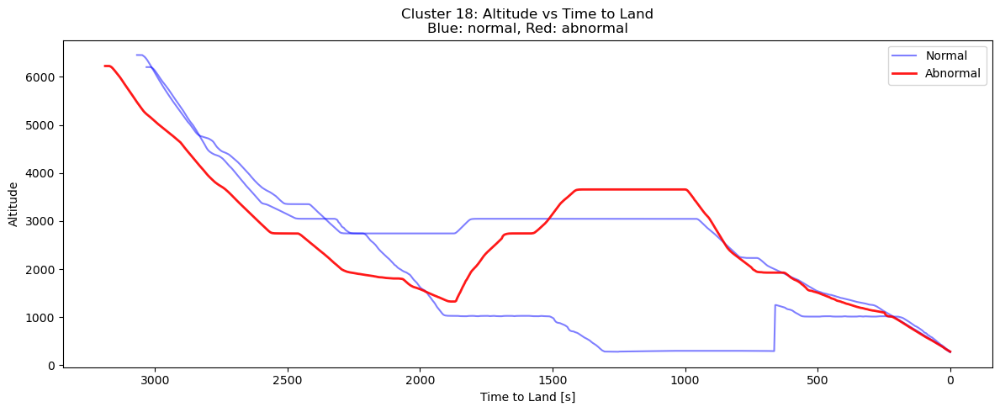

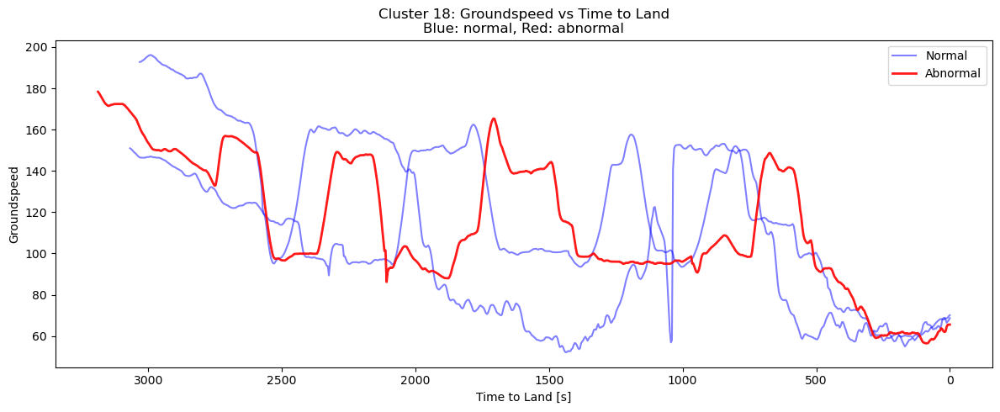

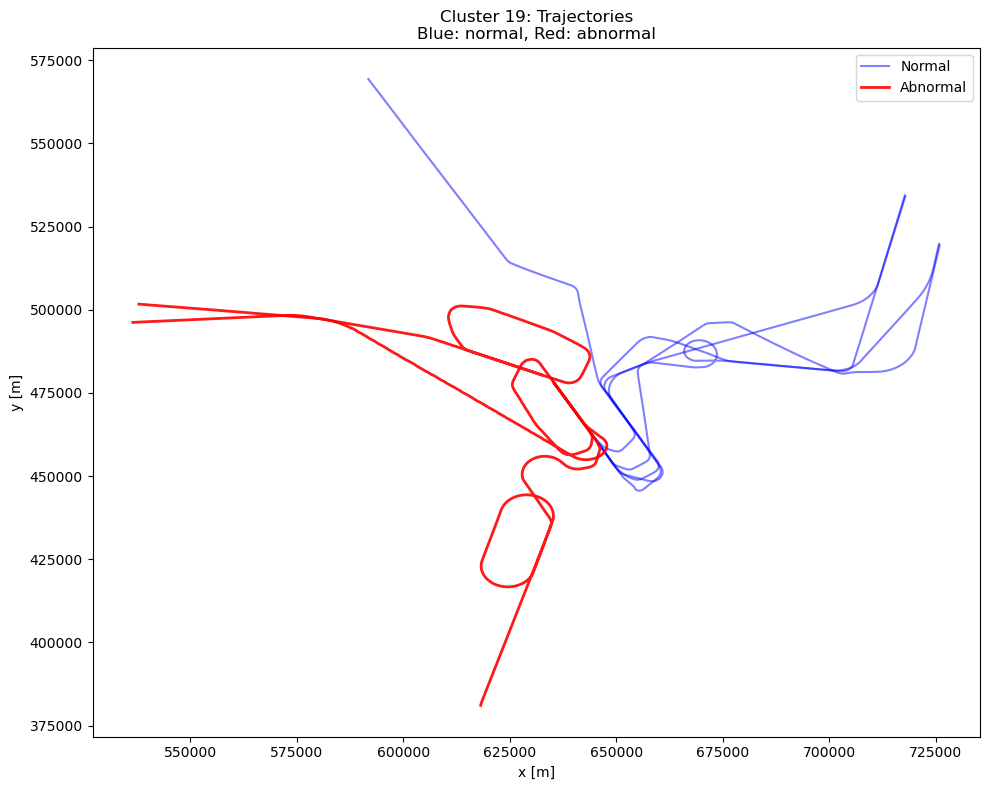

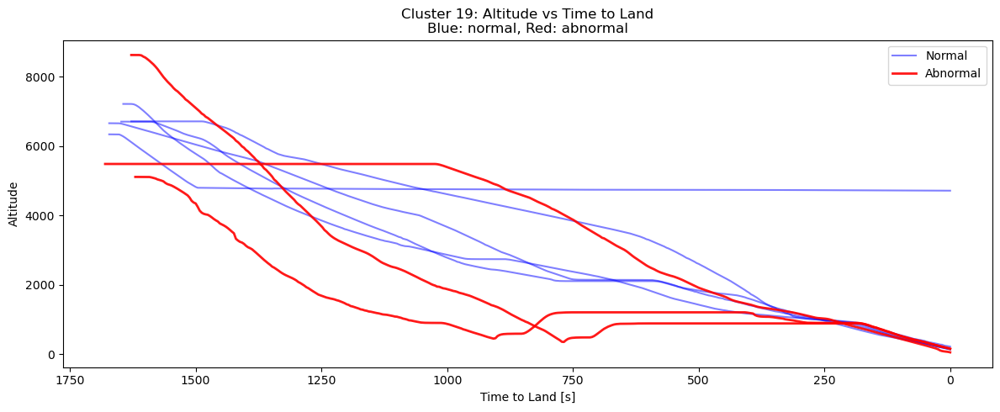

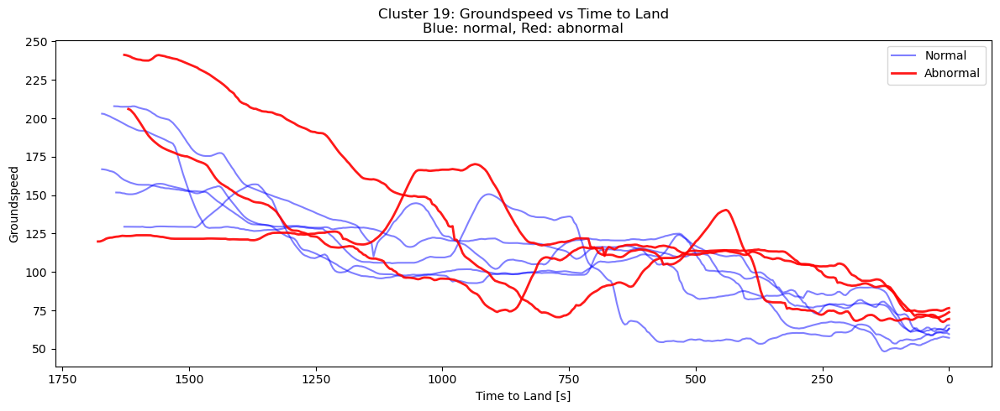

In [122]:
for cluster_id in range(n_clusters):
    idx = np.where(labels == cluster_id)[0]
    cluster_seqs = [energy_sequences[i] for i in idx]
    cluster_flights = [flights[i] for i in idx]

    # Reference: median length
    median_len = int(np.median([len(seq) for seq in cluster_seqs]))
    reference_seq = cluster_seqs[np.argmin([abs(len(seq) - median_len) for seq in cluster_seqs])]

    dtw_distances = [dtw.distance_fast(seq, reference_seq) for seq in cluster_seqs]
    threshold = np.percentile(dtw_distances, 95)
    anomaly_indices = np.where(np.array(dtw_distances) >= threshold)[0]
    normal_indices = np.where(np.array(dtw_distances) < threshold)[0][:5]

    # Plot ground track
    plt.figure(figsize=(10, 8))
    for i in normal_indices:
        plt.plot(cluster_flights[i].data['x'], cluster_flights[i].data['y'], color='blue', alpha=0.5, label='Normal' if i == normal_indices[0] else "")
    for i in anomaly_indices:
        plt.plot(cluster_flights[i].data['x'], cluster_flights[i].data['y'], color='red', alpha=0.9, linewidth=2, label='Abnormal' if i == anomaly_indices[0] else "")
    plt.title(f"Cluster {cluster_id}: Trajectories\nBlue: normal, Red: abnormal")
    plt.xlabel("x [m]")
    plt.ylabel("y [m]")
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Plot altitude and groundspeed vs time_to_land (inverted x-axis)
    for param, color in zip(['altitude', 'groundspeed'], ['orange', 'green']):
        plt.figure(figsize=(12, 5))
        for i in normal_indices:
            df = cluster_flights[i].data
            time_to_land = (df['timestamp'].iloc[-1] - df['timestamp']).dt.total_seconds()
            plt.plot(time_to_land, df[param], color='blue', alpha=0.5, label='Normal' if i == normal_indices[0] else "")
        for i in anomaly_indices:
            df = cluster_flights[i].data
            time_to_land = (df['timestamp'].iloc[-1] - df['timestamp']).dt.total_seconds()
            plt.plot(time_to_land, df[param], color='red', alpha=0.9, linewidth=2, label='Abnormal' if i == anomaly_indices[0] else "")
        plt.title(f"Cluster {cluster_id}: {param.capitalize()} vs Time to Land\nBlue: normal, Red: abnormal")
        plt.xlabel("Time to Land [s]")
        plt.ylabel(param.capitalize())
        plt.legend()
        plt.gca().invert_xaxis()
        plt.tight_layout()
        plt.show()
